# The notebook shows how the model's 'score' value affects object detection

In [1]:
import matplotlib.pyplot as plt
from mmdet.apis import init_detector

from tools.rectangles import get_coco_rects, get_mmdet_rects, filter_rectangles
from tools.rectangles import draw_rectangles
from tools.annotations import get_files_annotations
from tools.constans import Categories, json_annotations


/home/nolok/anaconda3/envs/preannotation/lib/python3.10/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


In [2]:
config_file = './models/yolov3_mobilenetv2_320_300e_coco.py'

checkpoint_file = \
    './models/yolov3_mobilenetv2_320_300e_coco_20210719_215349-d18dff72.pth'

model = init_detector(config_file, checkpoint_file, device="cpu")


load checkpoint from local path: ./models/yolov3_mobilenetv2_320_300e_coco_20210719_215349-d18dff72.pth


### How filter_rectangles function works

--- mmdet score ---
min	max	avg
0.002	0.925	0.082
--- < < --- > > ---


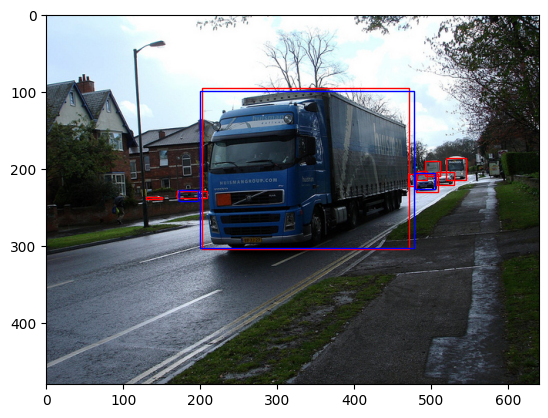

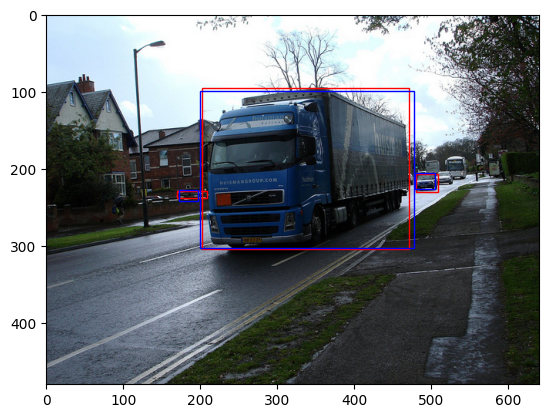

0.08700940642474045 0.6794102837433019


In [3]:
files = get_files_annotations(json_annotations, Categories.VEHICLES.value)

file_path = "./coco/images/000000033109.jpg"
min_ji_index = 0.4

coco_rects = get_coco_rects(files[file_path.split("/")[-1]])
mmdet_rects = get_mmdet_rects(file_path, model)

draw_rectangles(file_path, coco_rects, mmdet_rects)

sorted_coco_rect, sorted_mmdet_rect, ji_avg1, ji_avg2 = filter_rectangles(
    coco_rects, mmdet_rects, min_ji_index
    )

draw_rectangles(file_path, sorted_coco_rect, sorted_mmdet_rect)

print(ji_avg1, ji_avg2)


In [5]:
results: dict[float, dict[str, list[int]]] = {}


for min_score in [x/100 for x in range(0, 101, 5)]:
    results[min_score] = {
        "correct": [],
        "detected": [],
        "filtered": []
    }
    for file_name in files:
        file_path = f"./coco/images/{file_name}"

        coco_rects = get_coco_rects(files[file_name])
        mmdet_rects = get_mmdet_rects(file_path, model, False, min_score)

        sorted_coco_rect, sorted_mmdet_rect, _, _ = filter_rectangles(
            coco_rects, mmdet_rects
            )

        results[min_score]["correct"].append(len(coco_rects))
        results[min_score]["detected"].append(len(mmdet_rects))
        results[min_score]["filtered"].append(len(sorted_coco_rect))


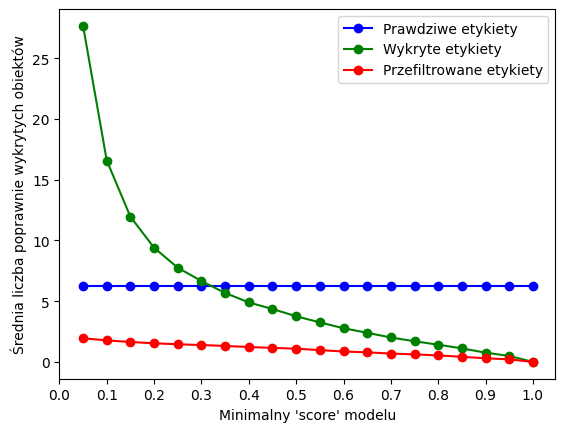

In [6]:
x = []
y_correct, y_detected, y_filtered = [], [], []

for key, values in results.items():
    if key != 0:
        x.append(float(key))
        y_correct.append(sum(values["correct"])/len(values["correct"]))
        y_detected.append(sum(values["detected"])/len(values["detected"]))
        y_filtered.append(sum(values["filtered"])/len(values["filtered"]))

plt.plot(x, y_correct, "bo-", label="Prawdziwe etykiety")
plt.plot(x, y_detected, "go-", label="Wykryte etykiety")
plt.plot(x, y_filtered, "ro-", label="Przefiltrowane etykiety")

plt.xticks([x/100 for x in range(0, 101, 10)])
plt.xlabel("Minimalny 'score' modelu")
plt.ylabel("Średnia liczba poprawnie wykrytych obiektów")
plt.legend()
plt.show()


In [7]:
if False:  # Save results to a file
    import json
    with open("jaccard_index.json", "w", -1, "utf-8") as file:
        print(json.dumps(ji_index_results), file=file)


Min model score value: 0.0


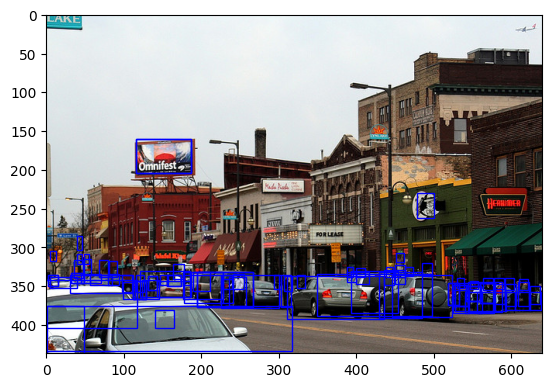

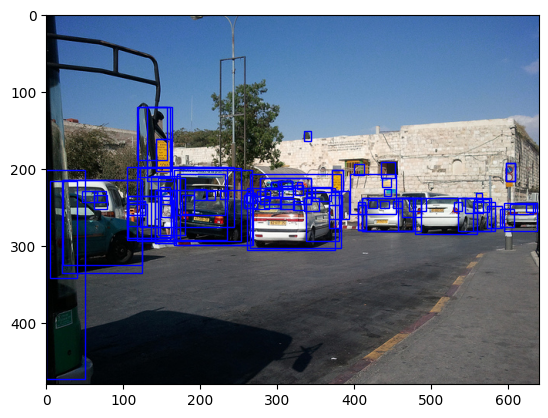

Min model score value: 0.05


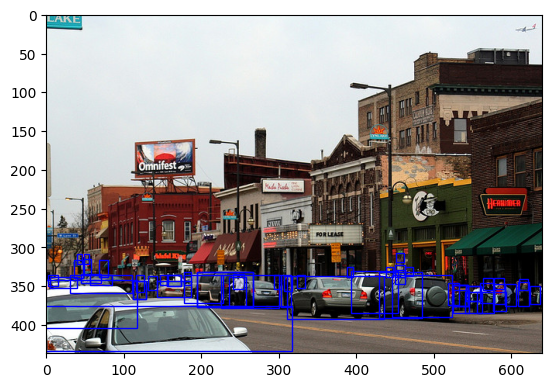

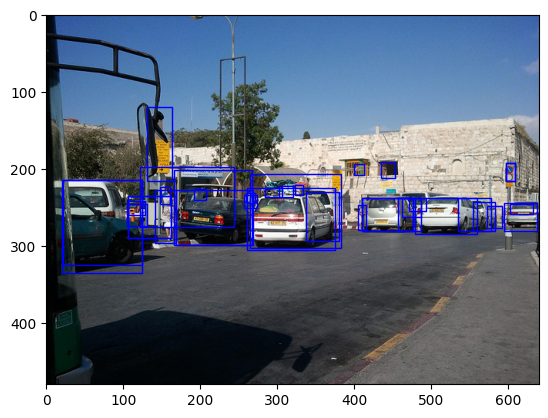

Min model score value: 0.1


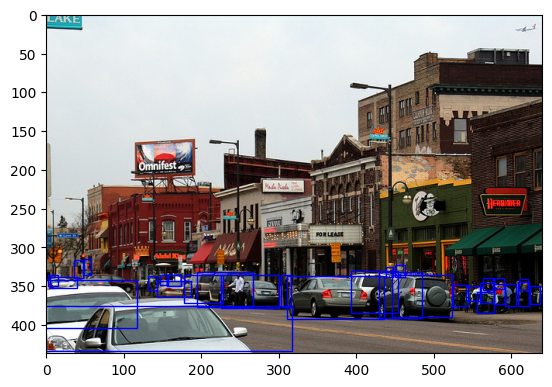

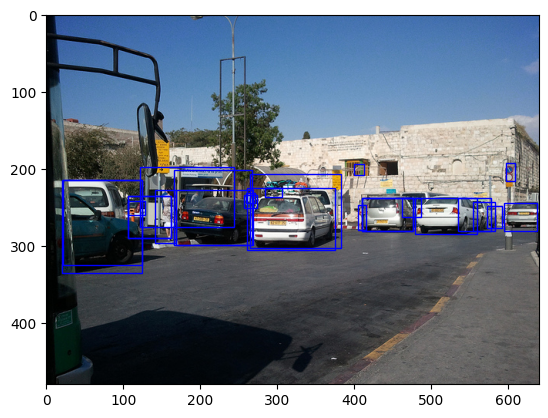

Min model score value: 0.15


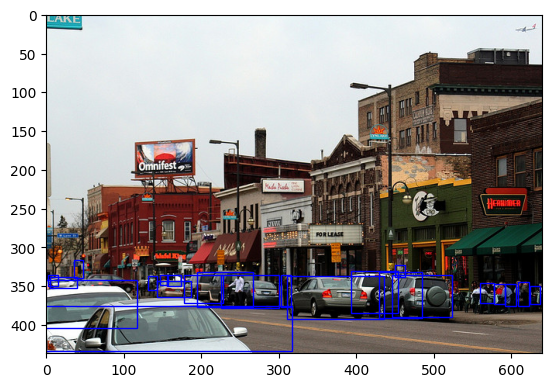

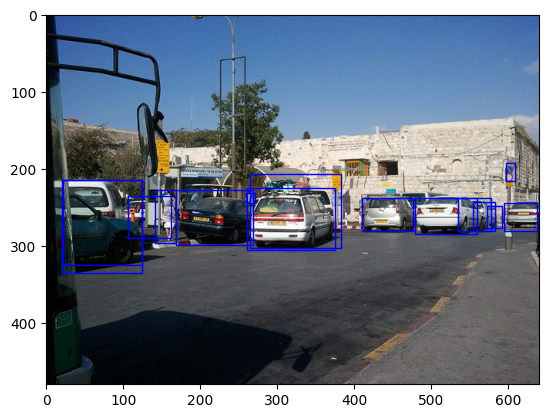

Min model score value: 0.2


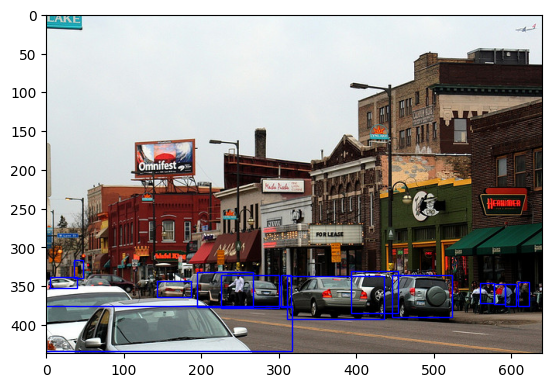

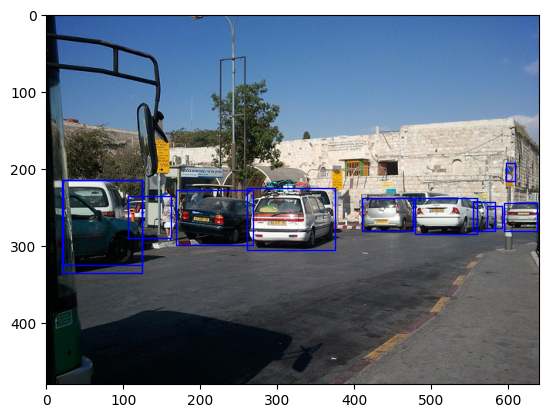

Min model score value: 0.25


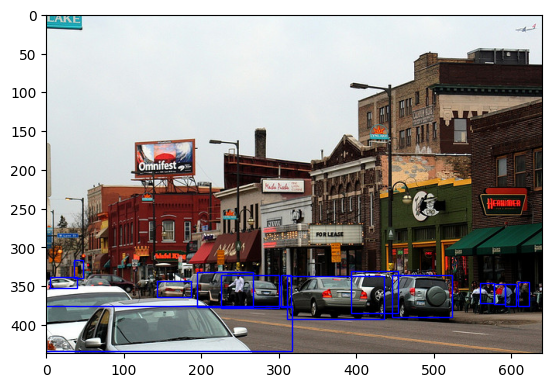

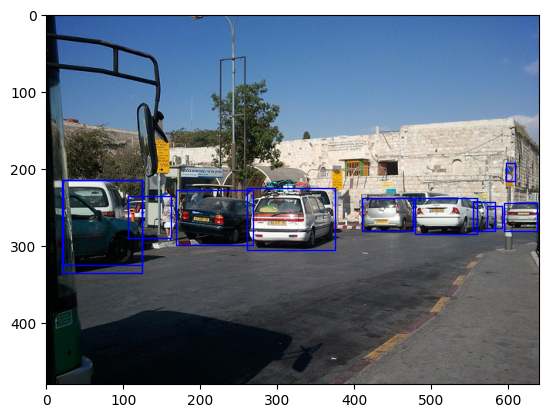

Min model score value: 0.3


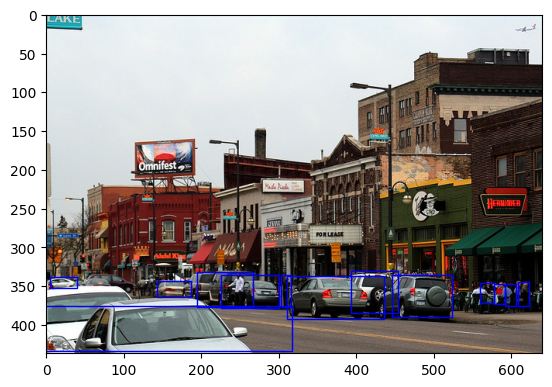

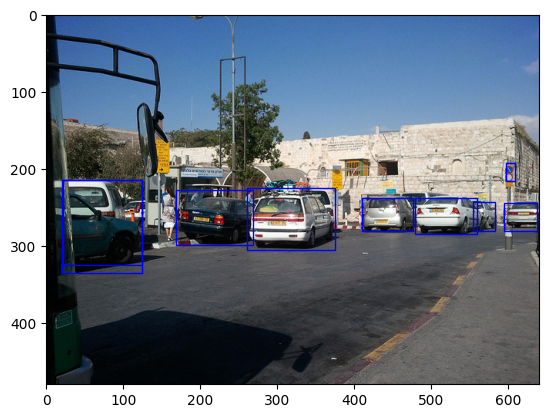

Min model score value: 0.35


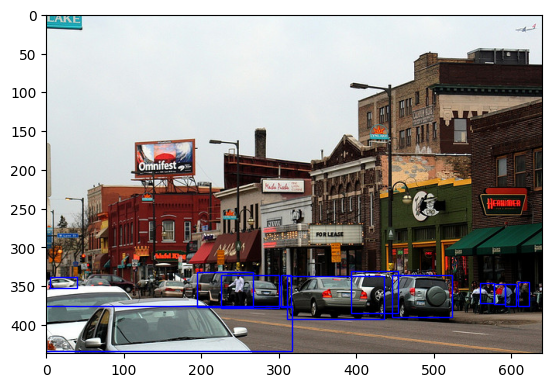

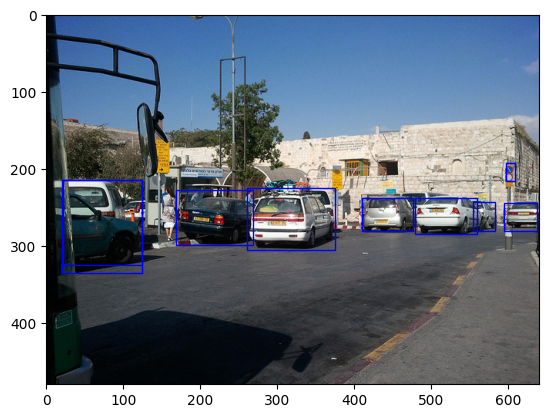

Min model score value: 0.4


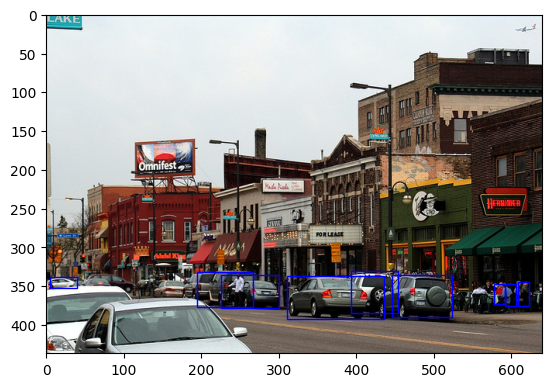

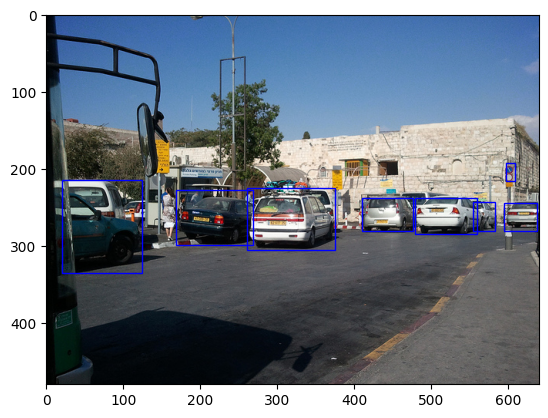

Min model score value: 0.45


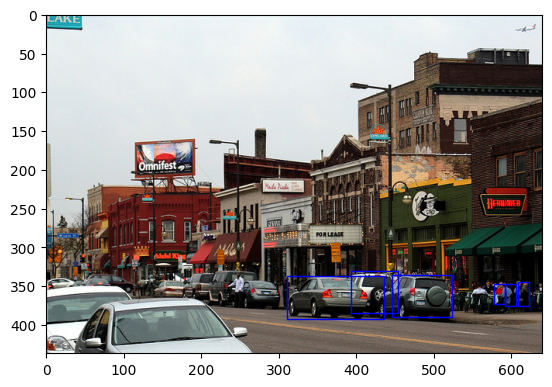

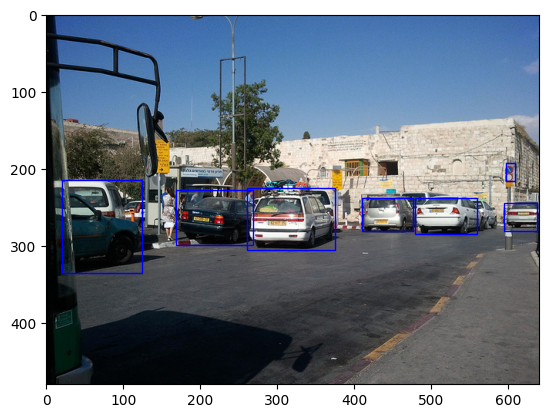

Min model score value: 0.5


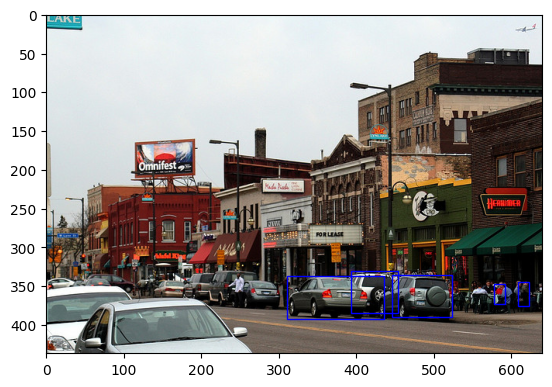

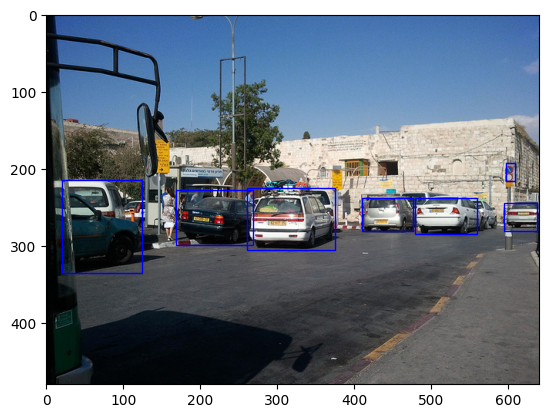

Min model score value: 0.55


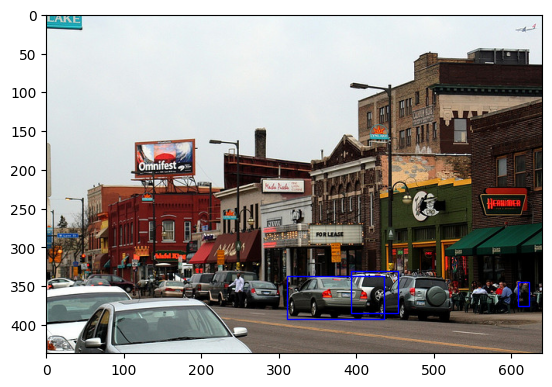

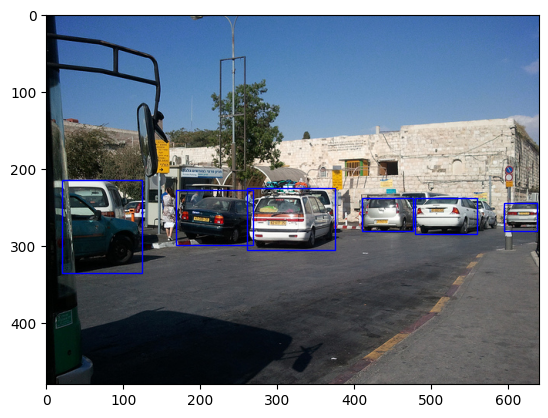

Min model score value: 0.6


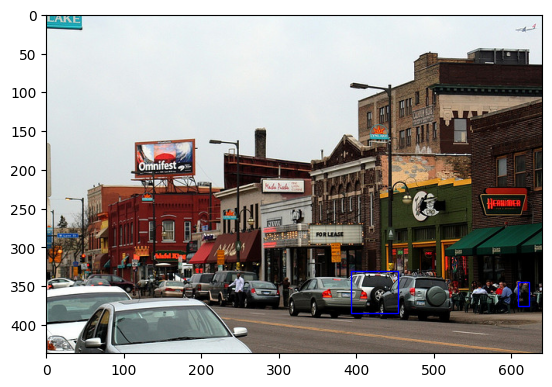

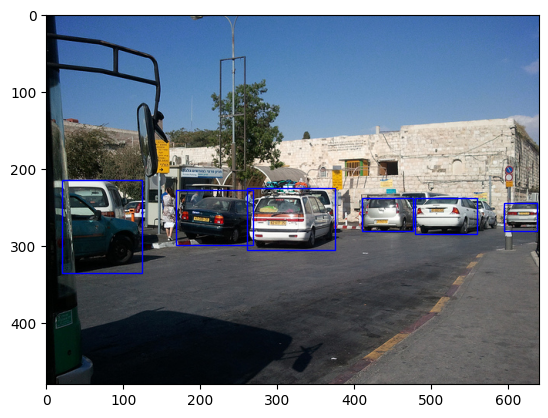

Min model score value: 0.65


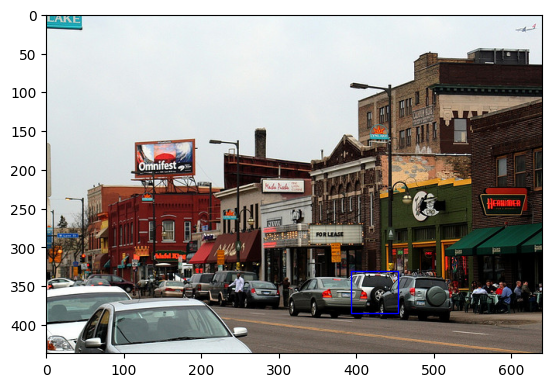

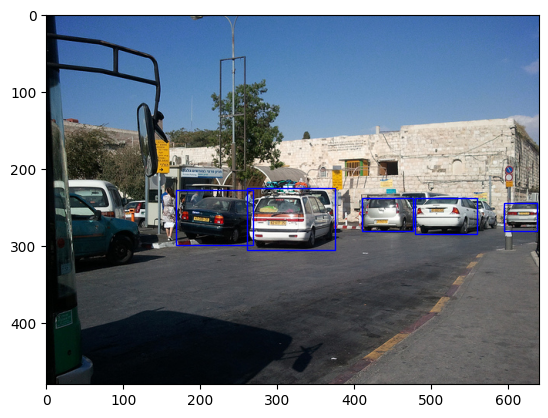

Min model score value: 0.7


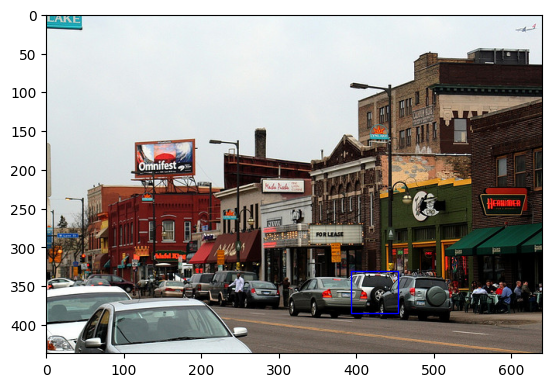

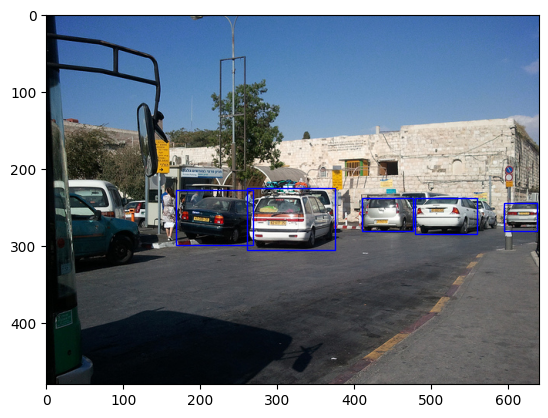

Min model score value: 0.75


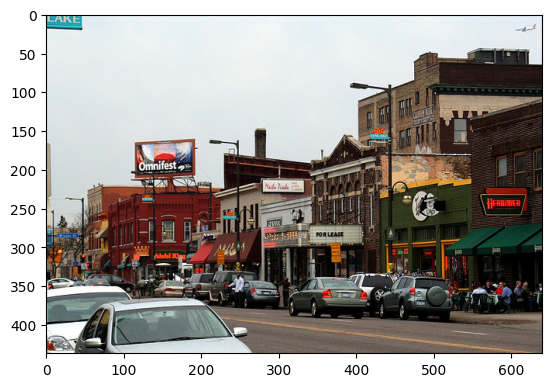

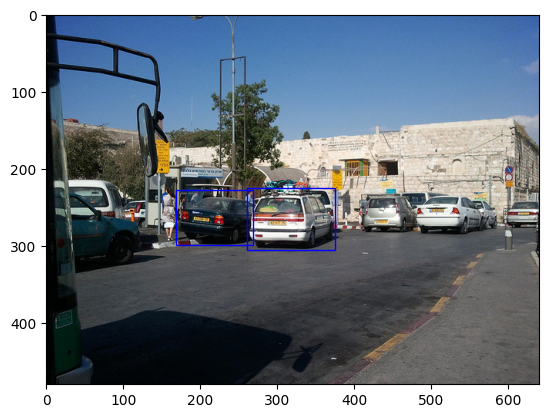

Min model score value: 0.8


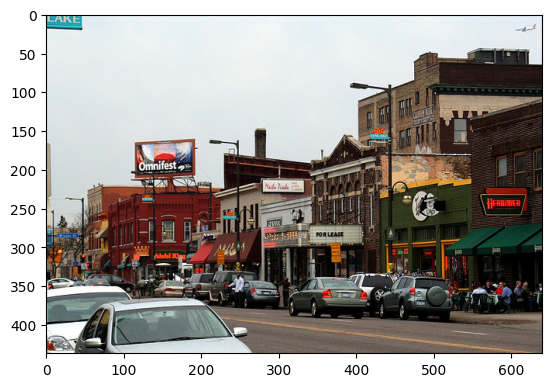

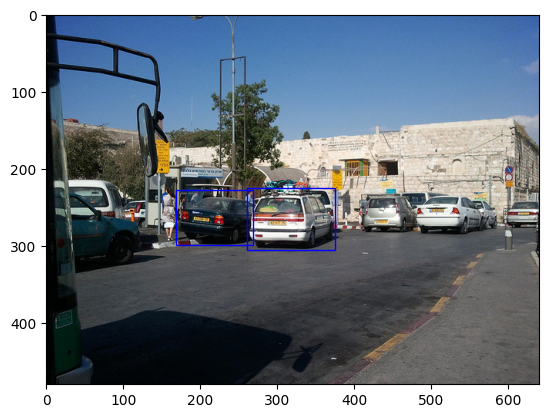

Min model score value: 0.85


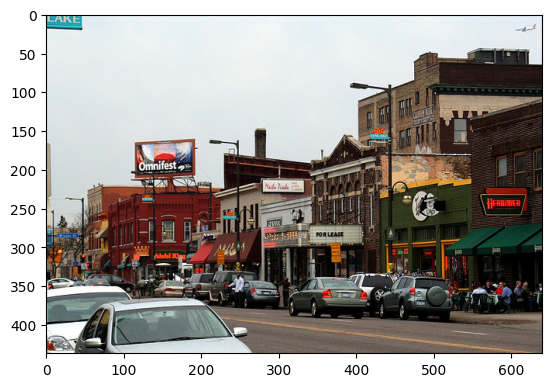

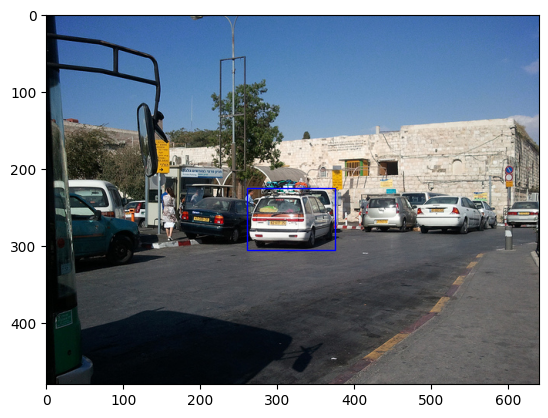

Min model score value: 0.9


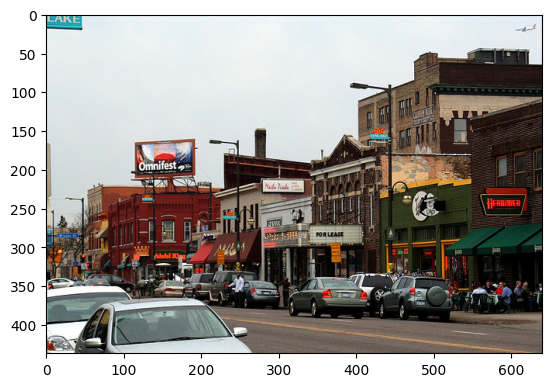

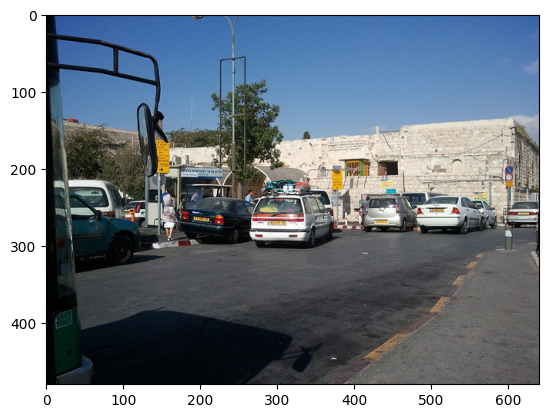

Min model score value: 0.95


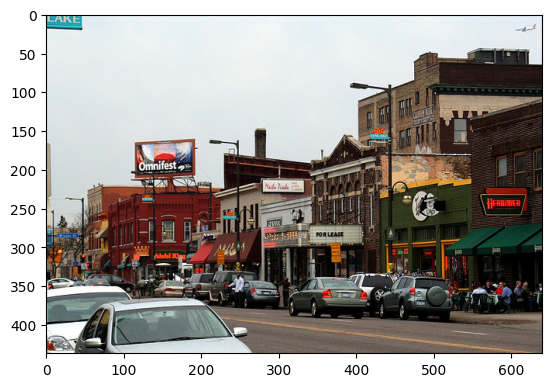

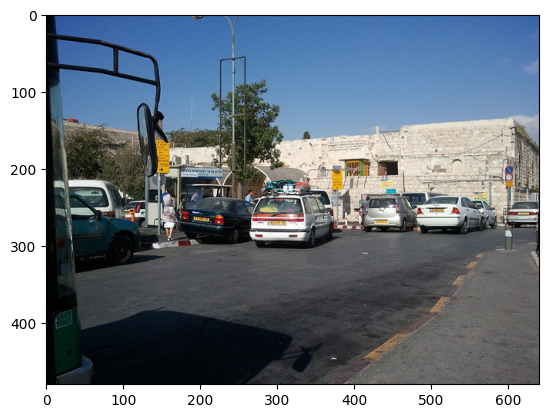

Min model score value: 1.0


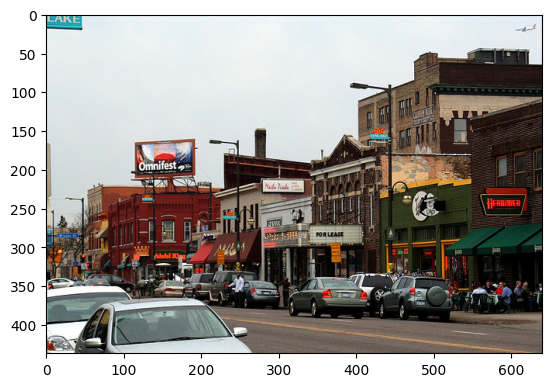

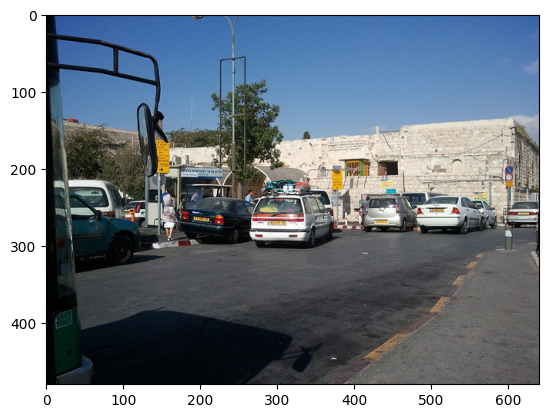

In [8]:
for min_score in [x/100 for x in range(0, 101, 5)]:
    print("Min model score value:", min_score)

    draw_rectangles("./coco/images/000000039484.jpg", [], get_mmdet_rects("./coco/images/000000039484.jpg", model, False, min_score))
    draw_rectangles("./coco/images/000000017627.jpg", [], get_mmdet_rects("./coco/images/000000017627.jpg", model, False, min_score))
